## Advanced Lane Finding Project

The goals / steps of this project are the following:

* Compute the camera calibration matrix and distortion coefficients given a set of chessboard images.
* Apply a distortion correction to raw images.
* Use color transforms, gradients, etc., to create a thresholded binary image.
* Apply a perspective transform to rectify binary image ("birds-eye view").
* Detect lane pixels and fit to find the lane boundary.
* Determine the curvature of the lane and vehicle position with respect to center.
* Warp the detected lane boundaries back onto the original image.
* Output visual display of the lane boundaries and numerical estimation of lane curvature and vehicle position.

---
## First, I'll compute the camera calibration using chessboard images

In [1]:
import numpy as np
import cv2
import glob
import matplotlib.pyplot as plt
%matplotlib qt

# prepare object points, like (0,0,0), (1,0,0), (2,0,0) ....,(6,5,0)
objp = np.zeros((6*9,3), np.float32)
objp[:,:2] = np.mgrid[0:9,0:6].T.reshape(-1,2)

# Arrays to store object points and image points from all the images.
objpoints = [] # 3d points in real world space
imgpoints = [] # 2d points in image plane.

# Make a list of calibration images
images = glob.glob('./camera_cal/calibration*.jpg')

# Step through the list and search for chessboard corners
for fname in images:
    img = cv2.imread(fname)
    gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    ret, corners = cv2.findChessboardCorners(gray, (9,6),None)

    # If found, add object points, image points
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)

        # Draw and display the corners
        img = cv2.drawChessboardCorners(img, (9,6), corners, ret)
        cv2.imshow('img',img)
        cv2.waitKey(500)
        
cv2.destroyAllWindows()

Done.


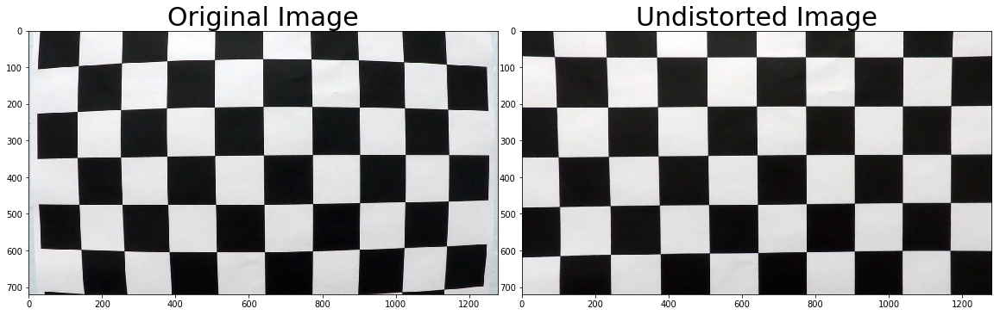

In [2]:
import pickle

# Test undistortion on an image
img = cv2.imread('./camera_cal/calibration1.jpg')
img_size = (img.shape[1], img.shape[0])

# Do camera calibration given object points and image points
ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img_size,None,None)
dst = cv2.undistort(img, mtx, dist, None, mtx)

# Save the camera calibration result for later use (we won't worry about rvecs / tvecs)
dist_pickle = {}
dist_pickle["mtx"] = mtx
dist_pickle["dist"] = dist
pickle.dump( dist_pickle, open( "calibration.p", "wb" ) )
dst = cv2.cvtColor(dst, cv2.COLOR_BGR2RGB)
# Visualize undistortion
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
f.subplots_adjust(hspace = .2, wspace=.05)
ax1.imshow(img)
ax1.set_title('Original Image', fontsize=30)
ax2.imshow(dst)
ax2.set_title('Undistorted Image', fontsize=30)
print('Done.')

## Read images

In [3]:
import math
from PIL import Image

# Undstort the image by using the saved parameters from cheeseboard
def cal_undistort(img):
    # Use cv2.calibrateCamera and cv2.undistort()
    with open('./calibration.p', mode='rb') as f:
        dist_pickle = pickle.load(f)
    mtx, dist = dist_pickle["mtx"], dist_pickle["dist"]
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    h, w = undist.shape[:2]
    return undist


# Perspective transform of image
def unwarp(img, src, dst):
    h,w = img.shape[:2]
    # use cv2.getPerspectiveTransform() to get M, the transform matrix, and Minv, the inverse
    M = cv2.getPerspectiveTransform(src, dst)
    Minv = cv2.getPerspectiveTransform(dst, src)
    # use cv2.warpPerspective() to warp your image to a top-down view
    warped = cv2.warpPerspective(img, M, (w,h), flags=cv2.INTER_LINEAR)
    return warped, M, Minv


# Plot the images in the specific folder
def visualize(filename, a):
    fig, axes = plt.subplots(2,3,figsize=(24,12),subplot_kw={'xticks':[],'yticks':[]})
    fig.subplots_adjust(hspace=0.03, wspace=0.05)
    for p in zip(sum(axes.tolist(),[]), a):
        p[0].imshow(p[1],cmap='gray')
    plt.tight_layout()
    fig.savefig(filename)
    plt.show()
    #plt.close()

print("Done.")

Done.


## Plot undistorted image

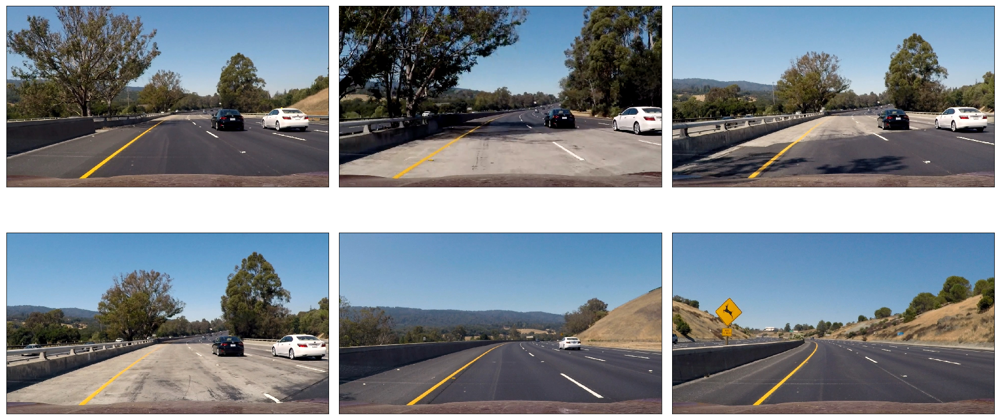

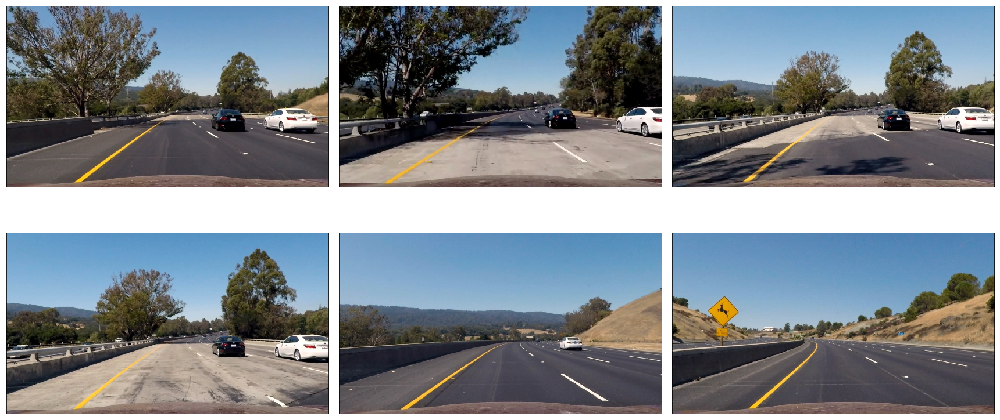

In [4]:
import matplotlib.image as mpimg
visualize("output_images/test_images.jpg",
            (mpimg.imread(f) for f in (glob.glob("test_images/test*.jpg"))))
visualize("output_images/test_images_undistorted.jpg", 
         (cal_undistort(mpimg.imread(f)) for f in (glob.glob("test_images/test*.jpg"))))

## Bird-view the images

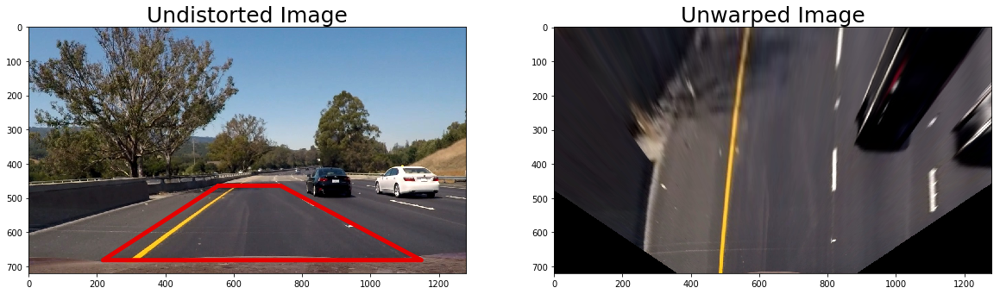

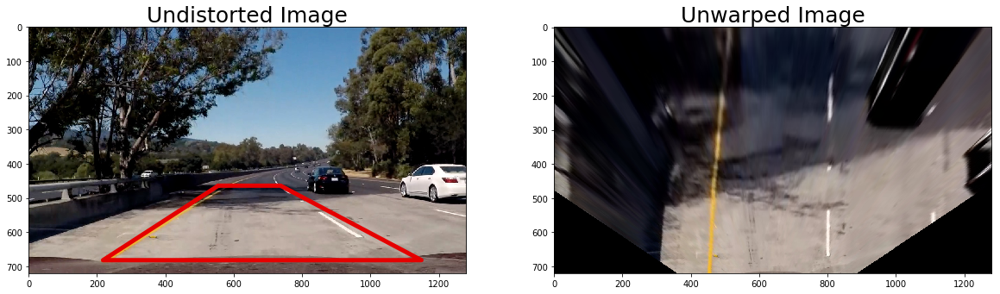

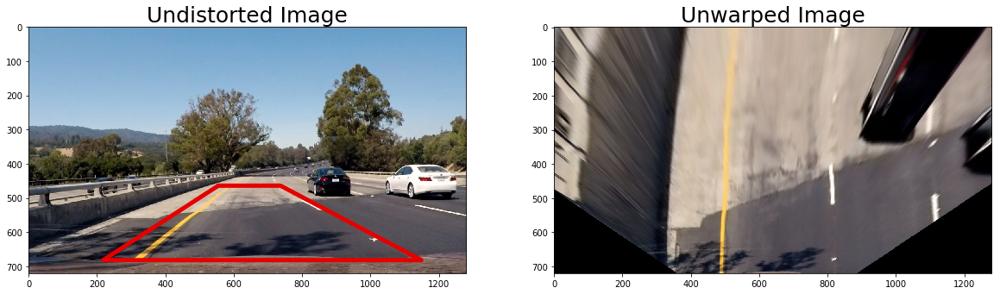

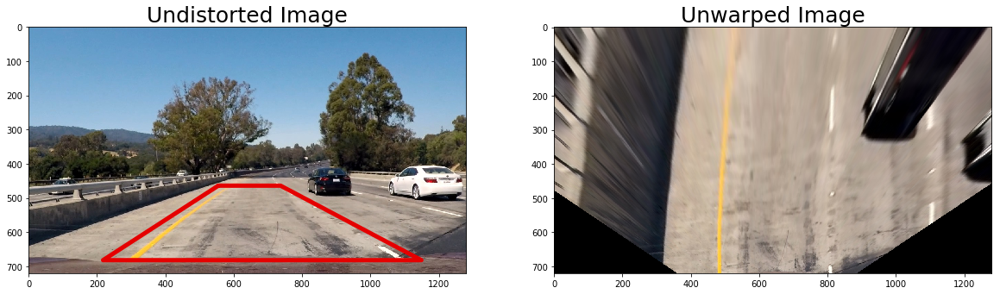

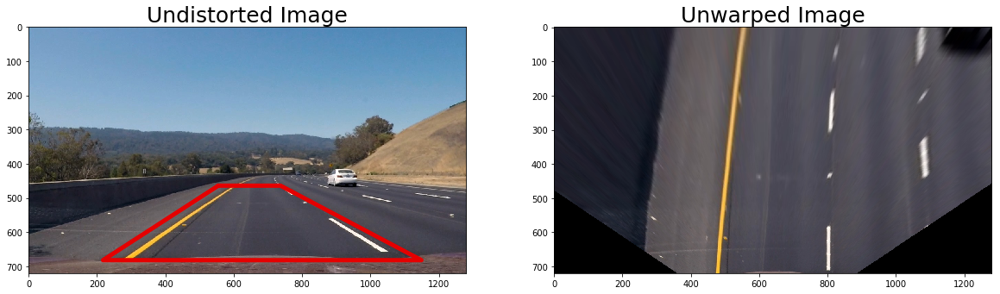

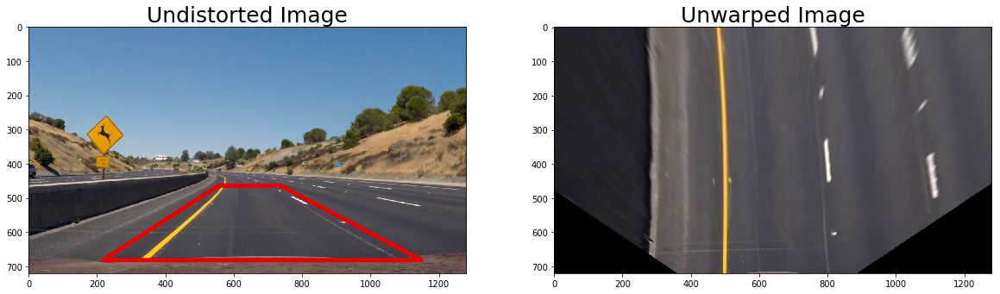

In [5]:
for f in (glob.glob("test_images/test*.jpg")):
    img = mpimg.imread(f)
    undist_image = cal_undistort(img)
    h, w = undist_image.shape[:2]
    # define source and destination points for transform
    src = np.float32([(555,464),
                    (737,464), 
                    (218,682), 
                    (1149,682)])
    dst = np.float32([(450,0),
                    (w-450,0),
                    (450,h),
                    (w-450,h)])
    unwrapped, M, Minv = unwarp(undist_image , src, dst)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    ax1.imshow(img)
    # Visualize unwarp
    x = [src[0][0],src[2][0],src[3][0],src[1][0],src[0][0]]
    y = [src[0][1],src[2][1],src[3][1],src[1][1],src[0][1]]
    ax1.plot(x, y, color='xkcd:red', alpha=1, linewidth=5, solid_capstyle='round', zorder=2)
    ax1.set_ylim([h,0])
    ax1.set_xlim([0,w])
    ax1.set_title('Undistorted Image', fontsize=25)
    ax2.imshow(unwrapped)
    ax2.set_title('Unwarped Image', fontsize=25)

## Region of interest

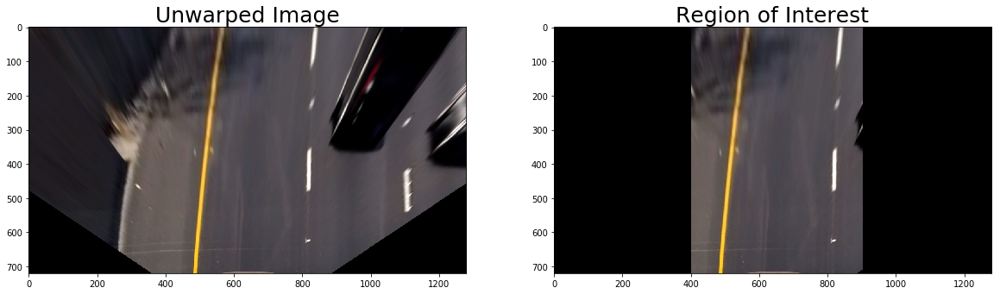

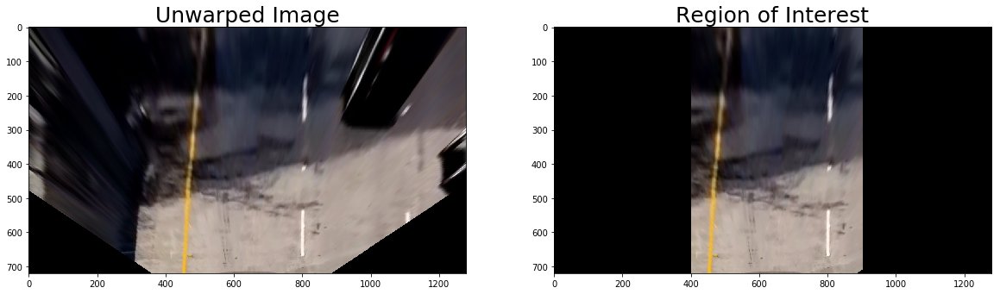

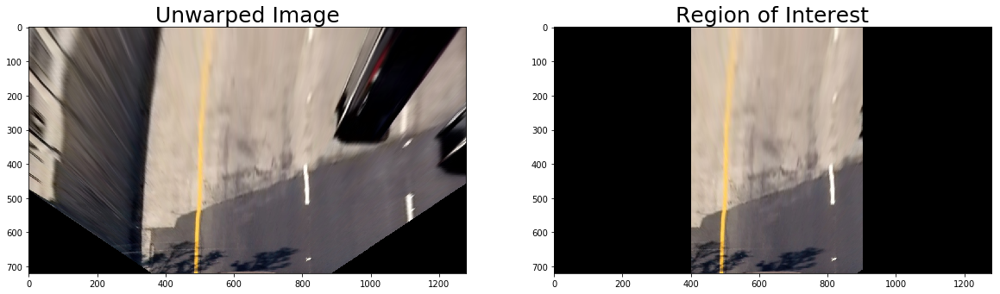

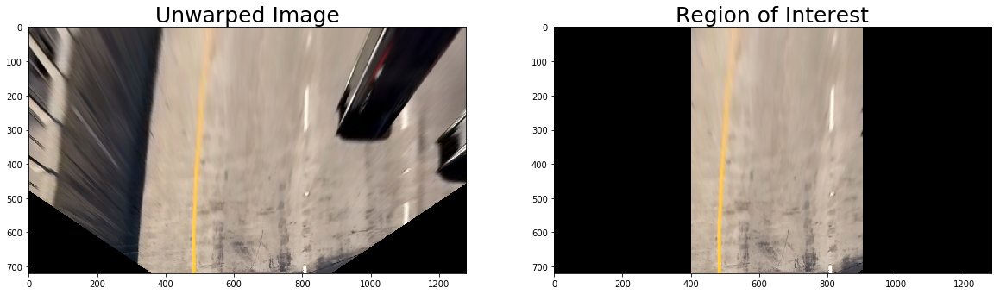

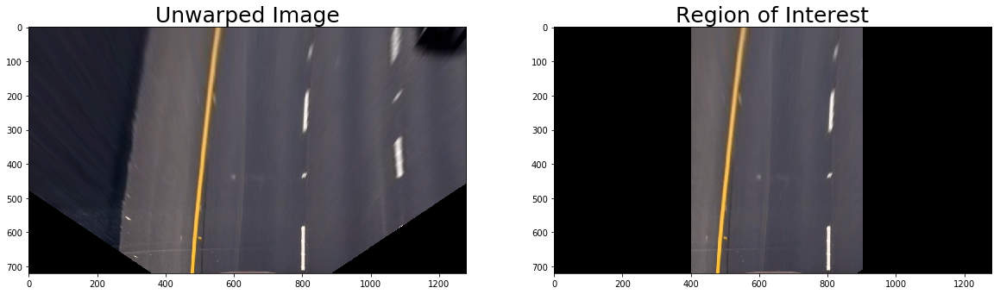

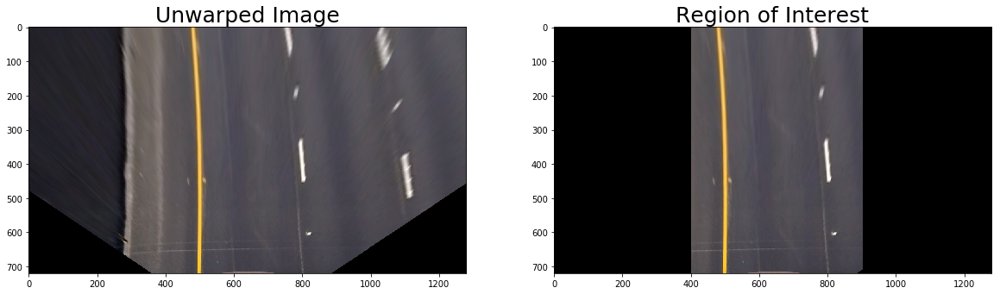

In [6]:
def region_of_interest(img, vertices):
    #defining a blank mask to start with
    mask = np.zeros_like(img)
    #defining a 3 channel or 1 channel color to fill
    #the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2] # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

for f in (glob.glob("test_images/test*.jpg")):
    img = mpimg.imread(f)
    undist_image = cal_undistort(img)
    h,w = undist_image.shape[:2]
    left_buttom = [400,h]
    right_buttom = [900,h]
    apex_left = [400,0]
    apex_right = [900,0]
    vertices = np.array([left_buttom, right_buttom, apex_right, apex_left], dtype = np.int32)
    unwrapped, M, Minv = unwarp(undist_image , src, dst)
    img_select = region_of_interest(unwrapped, [vertices])
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    # Visualize unwarp
    ax1.imshow(unwrapped)
    ax1.set_title('Unwarped Image', fontsize=25)
    ax2.imshow(img_select)
    ax2.set_title('Region of Interest', fontsize=25)

## Sobel operator for Canny

In [7]:
from PIL import Image, ImageEnhance

# Define a function that applies Sobel x or y, 
# then takes an absolute value and applies a threshold.
def abs_sobel_thres(img, orient='x', thres=(20,100)):
    # Apply the following steps to img
    # 1) Convert to grayscale === or LAB L channel
    gray = (cv2.cvtColor(img, cv2.COLOR_RGB2Lab))[:,:,0]
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    sobel = cv2.Sobel(gray, cv2.CV_64F, orient=='x', orient=='y')
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255*abs_sobel/np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude 
            # is > thresh_min and < thresh_max
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= thres[0]) & (scaled_sobel <= thres[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = sxbinary # Remove this line
    return binary_output


def mag_thres(img, sobel_kernel=9, mag_thres=(30,100)):
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1)
    # 3) Calculate the magnitude 
    mag_sobel = np.sqrt(np.square(sobelx) + np.square(sobely))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255*mag_sobel/np.max(mag_sobel))
    # 5) Create a binary mask where mag thresholds are met
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= mag_thres[0]) & (scaled_sobel <= mag_thres[1])] = 1
    # 6) Return this mask as your binary_output image
    binary_output = np.copy(sxbinary) 
    return binary_output


# Define a function that applies Sobel x and y, 
# then computes the direction of the gradient
# and applies a threshold.
def dir_thres(img, sobel_kernel=15, thres=(0.7, 1.3)):    
    # Apply the following steps to img
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient 
    grad_dir = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    binary_output =  np.zeros_like(grad_dir)
    binary_output[(grad_dir >= thres[0]) & (grad_dir <= thres[1])] = 1
    # 6) Return this mask as your binary_output image
    return binary_output


def clahecvt(original_image, image_shape):
    clahe = cv2.createCLAHE()
    clahe_image = np.ndarray(shape=(1, image_shape[0], image_shape[1], 1), dtype=np.uint8)
    image = original_image.squeeze()
    gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    clahe_images = clahe.apply(gray_image)
    #clahe_images = clahe_images.astype(int)
    return clahe_image


def Sobel_preprocess(image):
    undist_image = cal_undistort(image)
    h,w = undist_image.shape[:2]
    left_buttom = [400,h]
    right_buttom = [900,h]
    apex_left = [400,0]
    apex_right = [900,0]
    vertices = np.array([left_buttom, right_buttom, apex_right, apex_left], dtype = np.int32)
    src = np.float32([(555,464),
                    (737,464), 
                    (218,682), 
                    (1149,682)])
    dst = np.float32([(450,0),
                    (w-450,0),
                    (450,h),
                    (w-450,h)])
    unwrapped, M, Minv = unwarp(undist_image , src, dst)
    img_select = region_of_interest(unwrapped, [vertices])
    #img_select_shape = img_select.shape
    #image_clahe = clahecvt(img_select, img_select_shape)
    #contrast = ImageEnhance.Contrast(img_select)
    #image_contrast = contrast.enhance(2)
    return img_select

print('Done.')

Done.


## Sobel image process

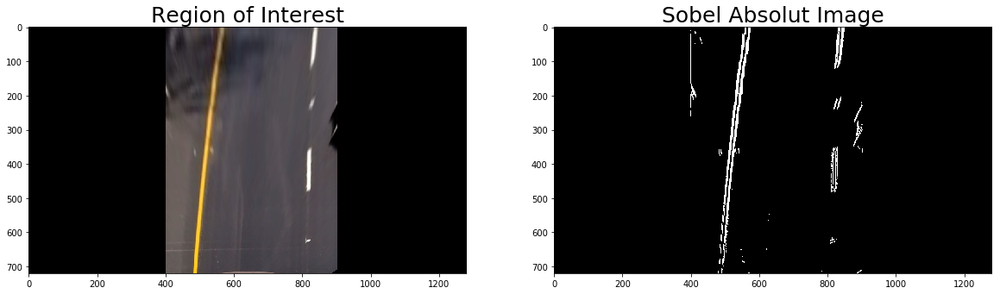

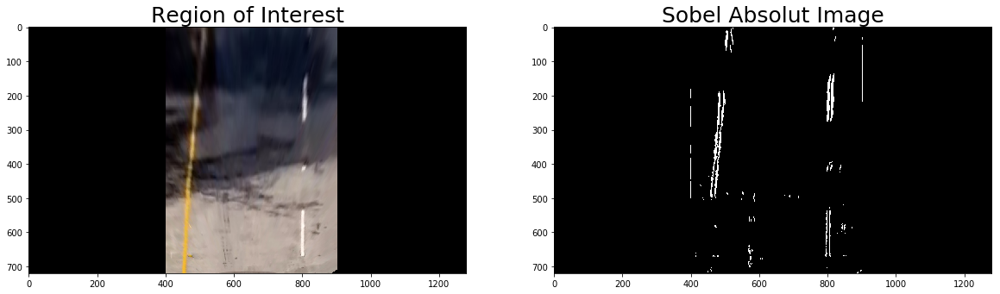

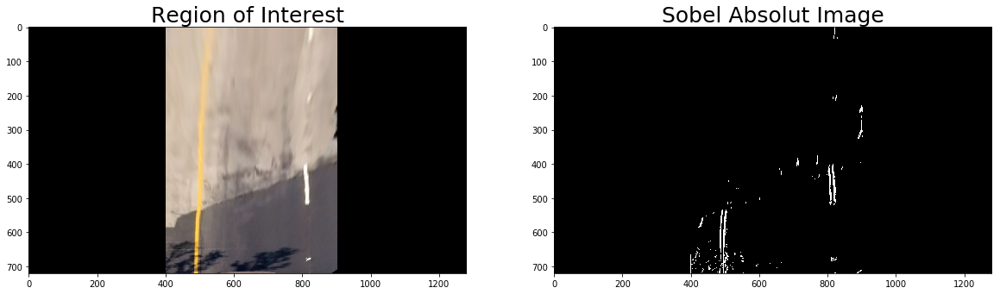

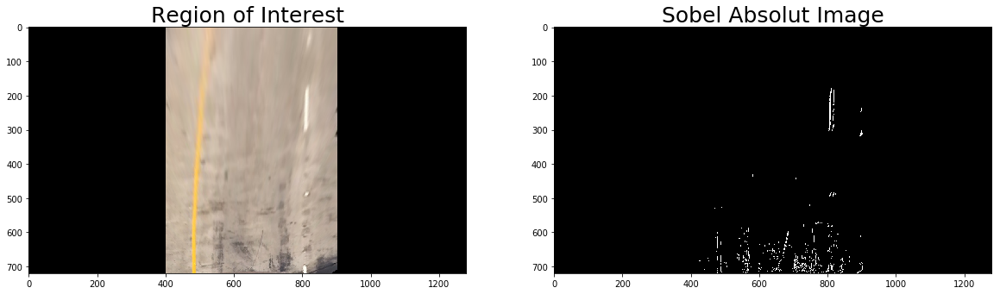

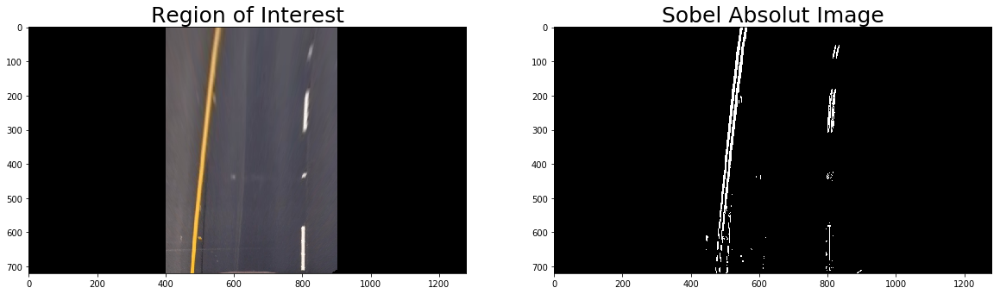

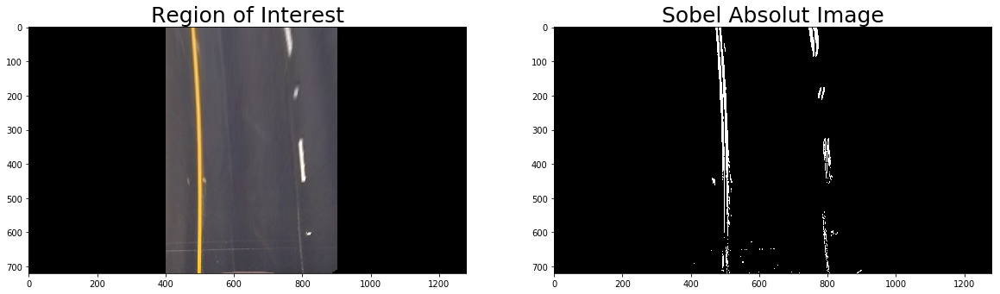

In [8]:
from __future__ import print_function
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets

def sobelabs_show(min_thres=20, max_thres=100):
    for f in (glob.glob("test_images/test*.jpg")):
        img = mpimg.imread(f)
        img_select = Sobel_preprocess(img)
        sobelabs_img = abs_sobel_thres(img_select, 'x', (min_thres,max_thres))
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img_select)
        ax1.set_title('Region of Interest', fontsize=25)
        ax2.imshow(sobelabs_img, cmap='gray')
        ax2.set_title('Sobel Absolut Image', fontsize=25)

sobelabs_show(20,100)

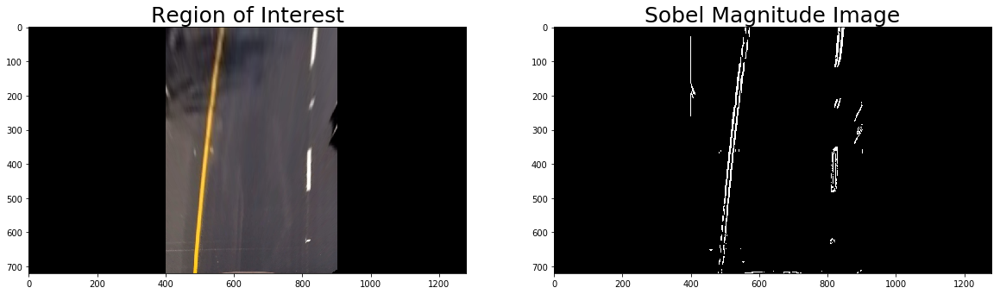

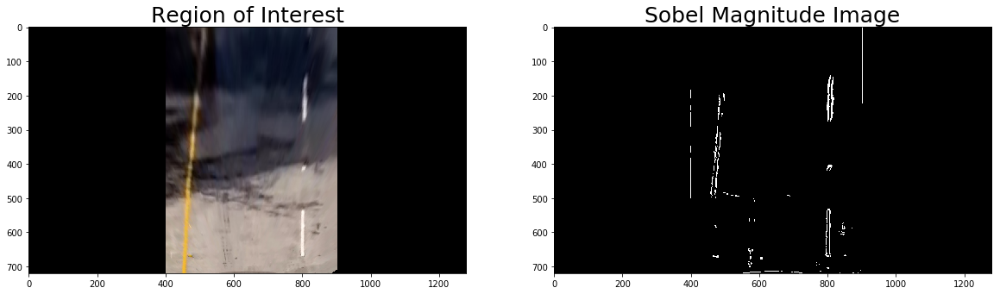

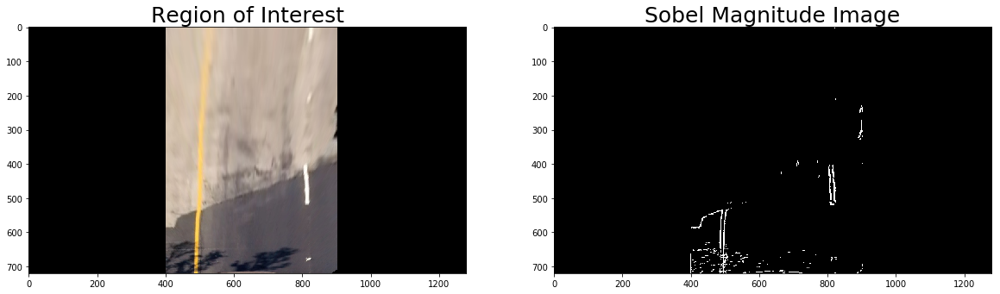

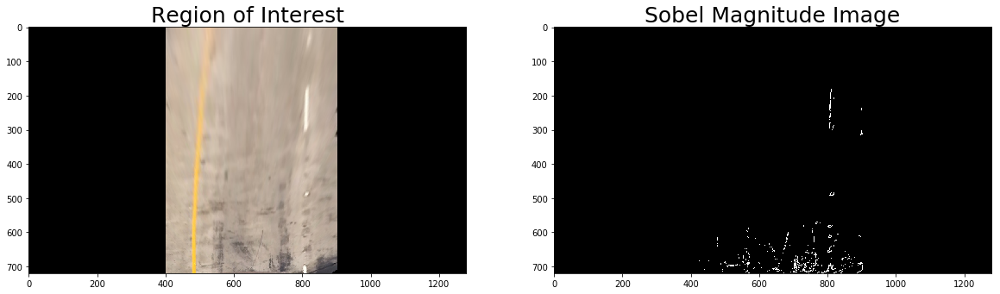

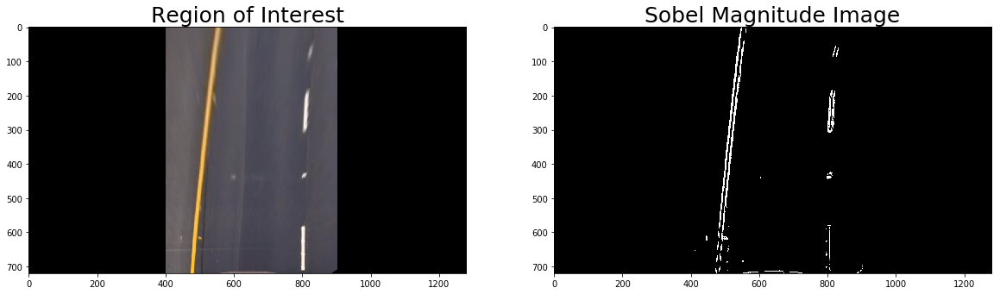

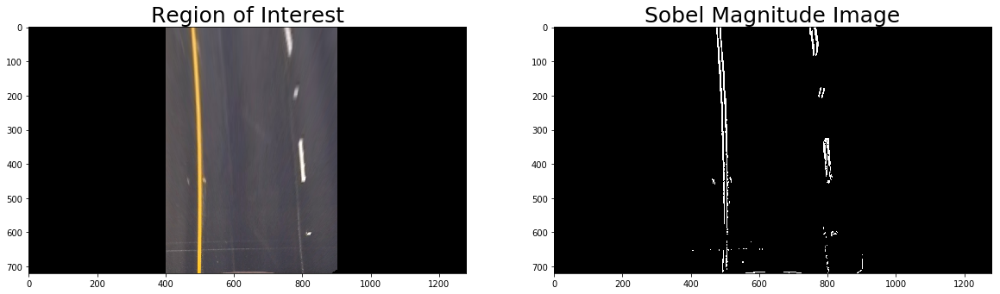

In [9]:
def mag_show(kernel_size=9, min_thres=30, max_thres=100):
    for f in (glob.glob("test_images/test*.jpg")):
        img = mpimg.imread(f)
        img_select = Sobel_preprocess(img)
        mag_img = mag_thres(img_select, kernel_size, (min_thres, max_thres))
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img_select)
        ax1.set_title('Region of Interest', fontsize=25)
        ax2.imshow(mag_img, cmap='gray')
        ax2.set_title('Sobel Magnitude Image', fontsize=25)

mag_show(9,30,100)

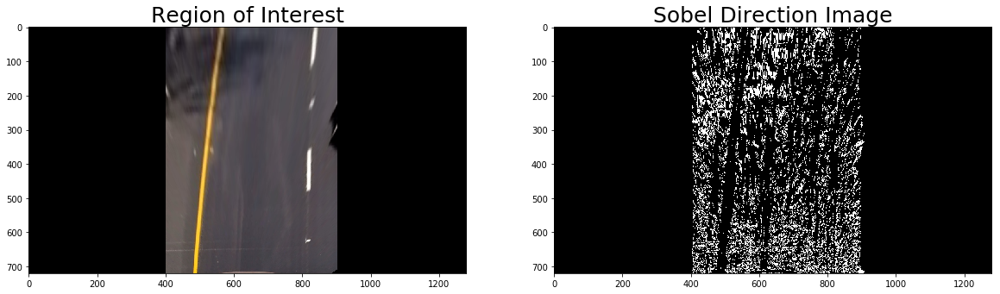

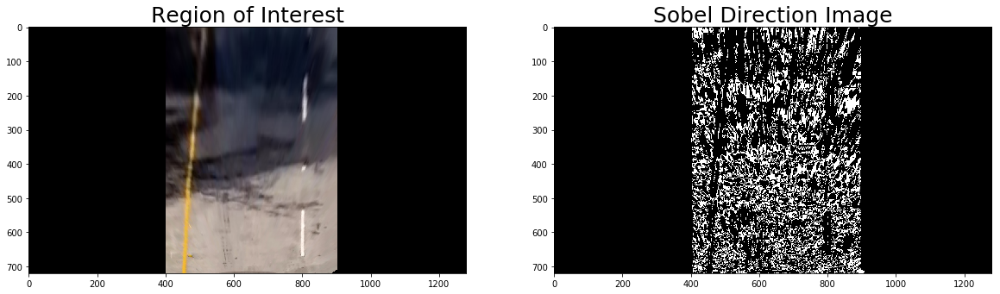

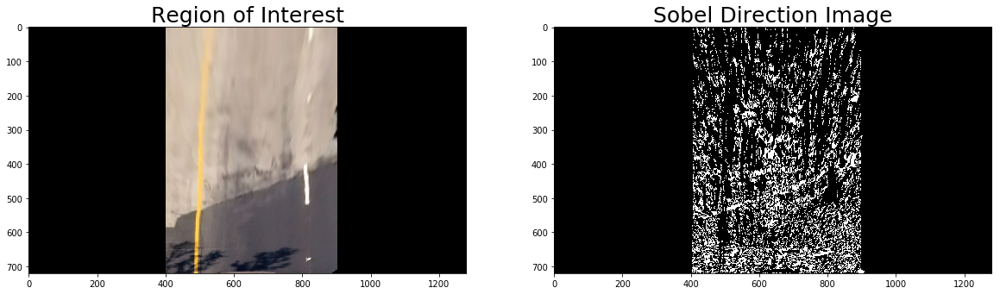

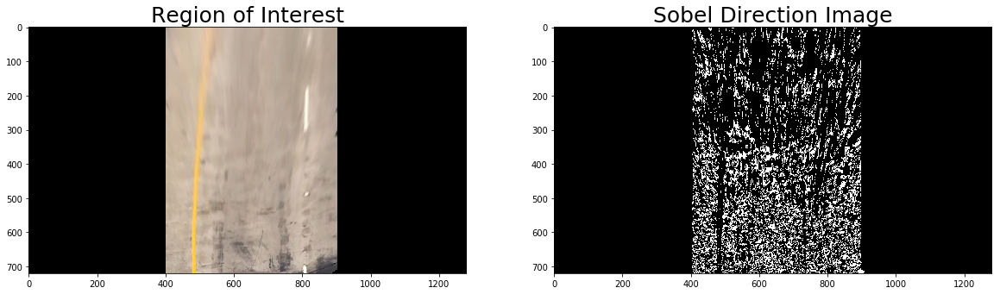

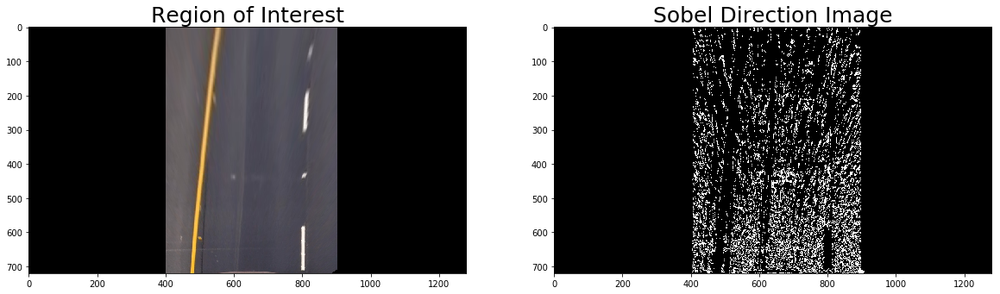

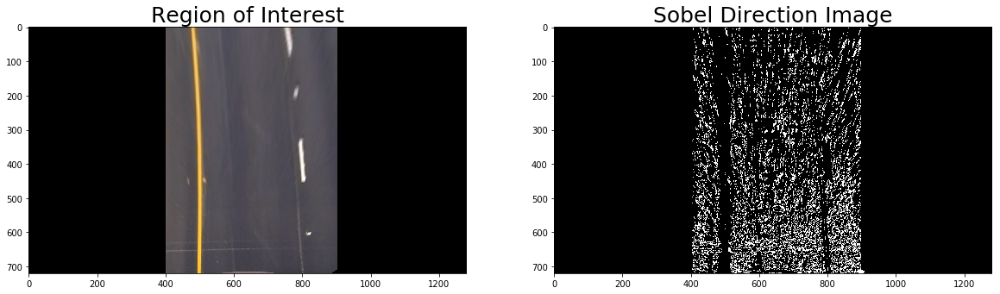

In [10]:
def dir_show(kernel_size=15, min_thres=0.7, max_thres=1.3):
    for f in (glob.glob("test_images/test*.jpg")):
        img = mpimg.imread(f)
        img_select = Sobel_preprocess(img)
        dir_img = dir_thres(img_select, kernel_size, (min_thres, max_thres))
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        ax1.imshow(img_select)
        ax1.set_title('Region of Interest', fontsize=25)
        ax2.imshow(dir_img, cmap='gray')
        ax2.set_title('Sobel Direction Image', fontsize=25)

dir_show(15,0.7,1.3)

In [11]:
def combined_thres(mag_kernel_size=3, mag_min_thres=7, mag_max_thres=100, dir_kernel_size=15, dir_min_thres=0.12, dir_max_thres=0.61):
    for f in (glob.glob("test_images/test*.jpg")):
        img = mpimg.imread(f)
        img_select = Sobel_preprocess(img)
        comb_magimg = mag_thres(img_select, mag_kernel_size, (mag_min_thres, mag_max_thres))
        comb_dirimg = dir_thres(img_select, dir_kernel_size, (dir_min_thres, dir_max_thres))
        combined = np.zeros_like(comb_magimg)
        combined[((comb_magimg == 1) & (comb_dirimg == 1))] = 1
        # Visualize sobel magnitude + direction threshold
        f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
        f.subplots_adjust(hspace = .2, wspace=.05)
        ax1.imshow(img)
        ax1.set_title('Original Image', fontsize=30)
        ax2.imshow(combined, cmap='gray')
        ax2.set_title('Sobel Magnitude + Direction', fontsize=30)

interact(combined_thres, mag_kernel_size=(1,31,2), 
                 mag_min_thres=(0,255), 
                 mag_max_thres=(0,255),
                 dir_kernel_size=(1,31,2), 
                 dir_min_thres=(0,np.pi/2,0.01), 
                 dir_max_thres=(0,np.pi/2,0.01))

interactive(children=(IntSlider(value=3, description='mag_kernel_size', max=31, min=1, step=2), IntSlider(valu…

<function __main__.combined_thres>

In [12]:
# Define a function that thresholds the S-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_sthres(img, thresh=(125, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # 2) Apply a threshold to the S channel
    binary_output = np.zeros_like(hls[:,:,2])
    binary_output[(hls[:,:,2] > thresh[0]) & (hls[:,:,2] <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output


# Define a function that thresholds the L-channel of HLS
# Use exclusive lower bound (>) and inclusive upper (<=)
def hls_lthres(img, thresh=(220, 255)):
    # 1) Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    hls_l = hls[:,:,1]
    hls_l = hls_l*(255/np.max(hls_l))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(hls_l)
    binary_output[(hls_l > thresh[0]) & (hls_l <= thresh[1])] = 1
    # 3) Return a binary image of threshold result
    return binary_output


# Define a function that thresholds the B-channel of LAB
# Use exclusive lower bound (>) and inclusive upper (<=), OR the results of the thresholds (B channel should capture
# yellows)
def lab_bthres(img, thresh=(190,255)):
    # 1) Convert to LAB color space
    lab = cv2.cvtColor(img, cv2.COLOR_RGB2Lab)
    lab_b = lab[:,:,2]
    # don't normalize if there are no yellows in the image
    if np.max(lab_b) > 175:
        lab_b = lab_b*(255/np.max(lab_b))
    # 2) Apply a threshold to the L channel
    binary_output = np.zeros_like(lab_b)
    binary_output[((lab_b > thresh[0]) & (lab_b <= thresh[1]))] = 1
    # 3) Return a binary image of threshold result
    return binary_output

print("Done.")

Done.


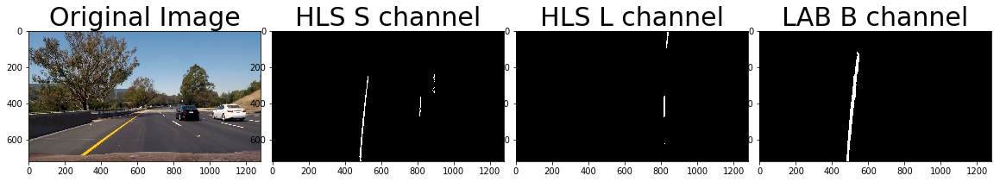

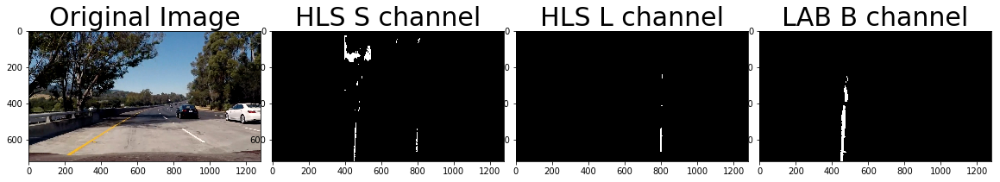

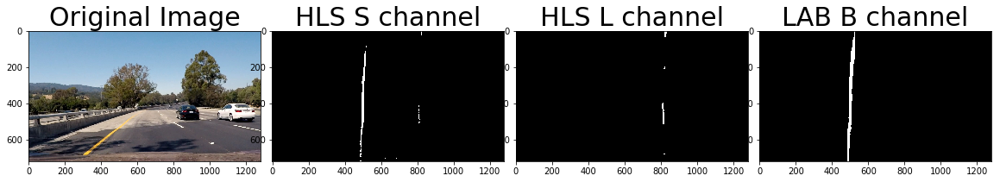

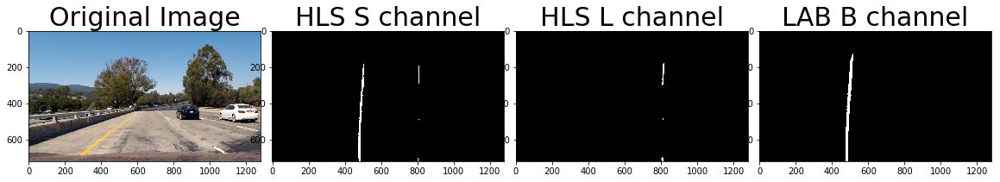

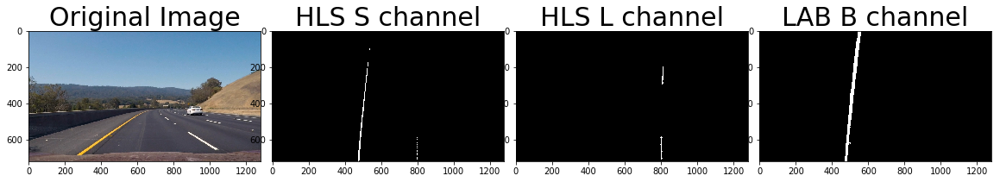

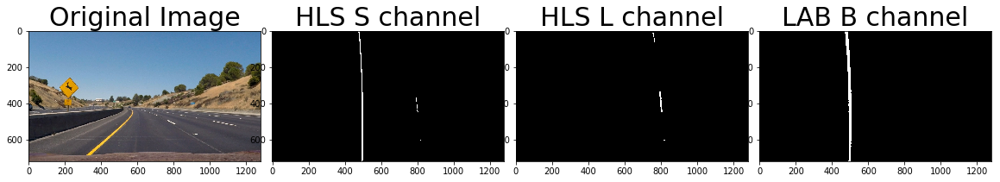

In [13]:
for f in (glob.glob("test_images/test*.jpg")):
    img = mpimg.imread(f)
    img_select = Sobel_preprocess(img)
    hls_simg = hls_sthres(img_select, (180, 255))
    hls_limg = hls_lthres(img_select, (220, 255))
    lab_bimg = lab_bthres(img_select, (190, 255))
    # Visualize sobel magnitude + direction threshold
    f, (ax1, ax2, ax3, ax4) = plt.subplots(1, 4, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(hls_simg, cmap='gray')
    ax2.set_title('HLS S channel', fontsize=30)
    ax3.imshow(hls_limg, cmap='gray')
    ax3.set_title('HLS L channel', fontsize=30)
    ax4.imshow(lab_bimg, cmap='gray')
    ax4.set_title('LAB B channel', fontsize=30)

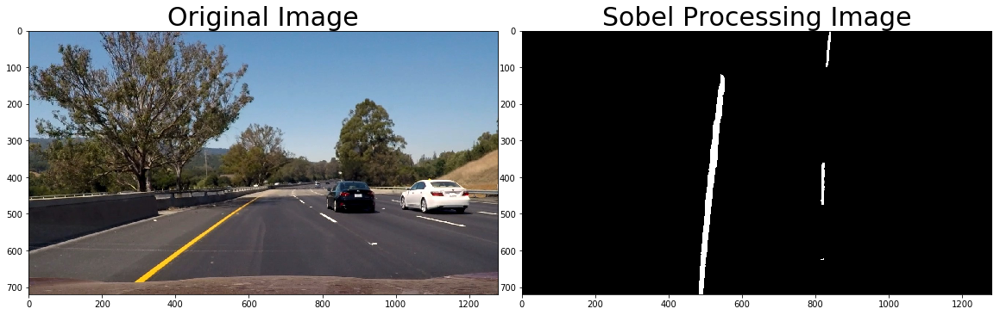

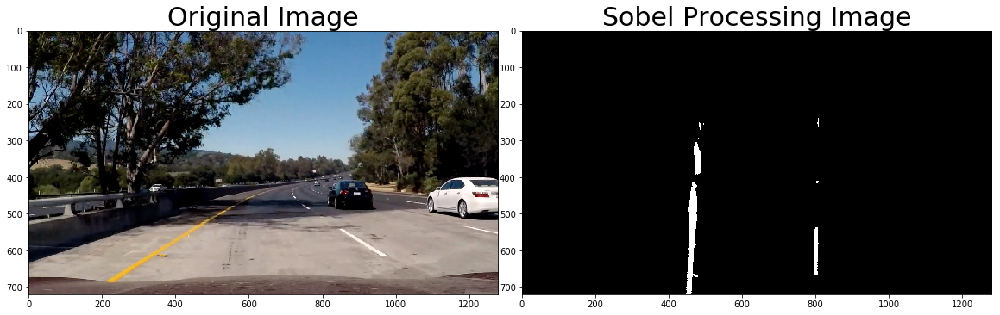

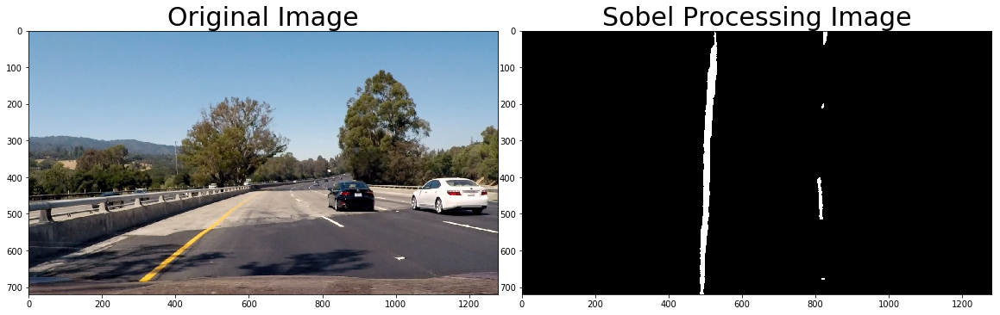

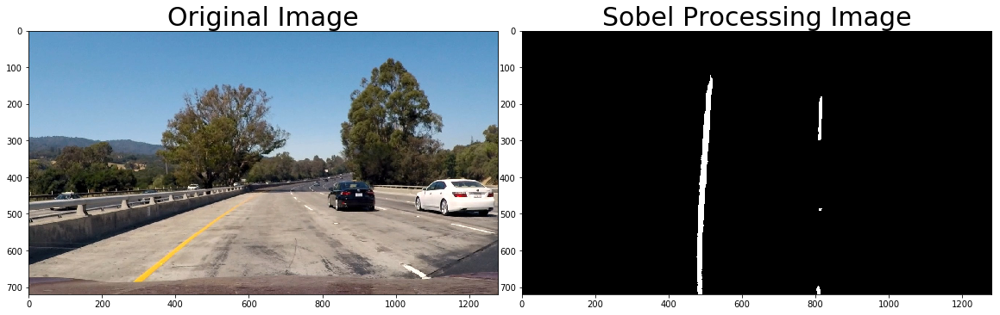

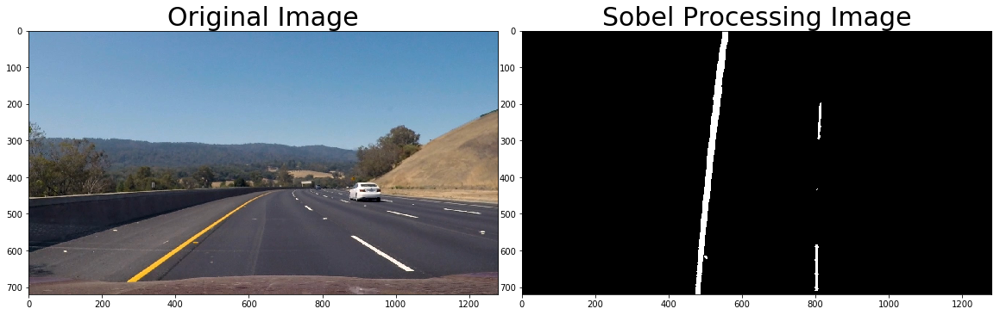

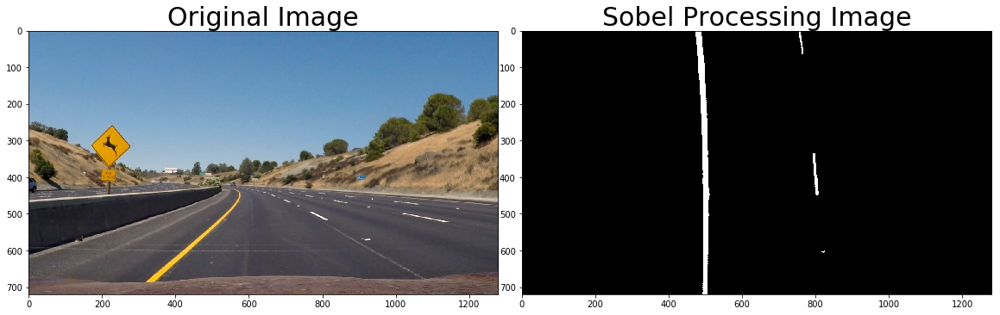

In [14]:
def SobelProcess(unwrapped_img):
    # Sobel Absolute (using default parameters)
    #img_sobelAbs = abs_sobel_thres(unwrapped_img)

    # Sobel Magnitude (using default parameters)
    #img_sobelMag = mag_thres(unwrapped_img)
    #img_sobelDir = dir_thres(unwrapped_img)
    
    # HLS S-channel Threshold (using default parameters)
    #img_SThresh = hls_sthres(unwrapped_img)

    # HLS L-channel Threshold (using default parameters)
    img_hls_L = hls_lthres(unwrapped_img)

    # Lab B-channel Threshold (using default parameters)
    img_lab_B = lab_bthres(unwrapped_img)
    
    # Combine HLS and Lab B channel thresholds
    combined = np.zeros_like(img_lab_B)
    combined[(img_hls_L == 1) | (img_lab_B == 1)] = 1
    return combined

for f in (glob.glob("test_images/test*.jpg")):
    img = mpimg.imread(f)
    img_select = Sobel_preprocess(img)
    comb_img = SobelProcess(img_select)
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(img)
    ax1.set_title('Original Image', fontsize=30)
    ax2.imshow(comb_img, cmap='gray')
    ax2.set_title('Sobel Processing Image', fontsize=30)
    

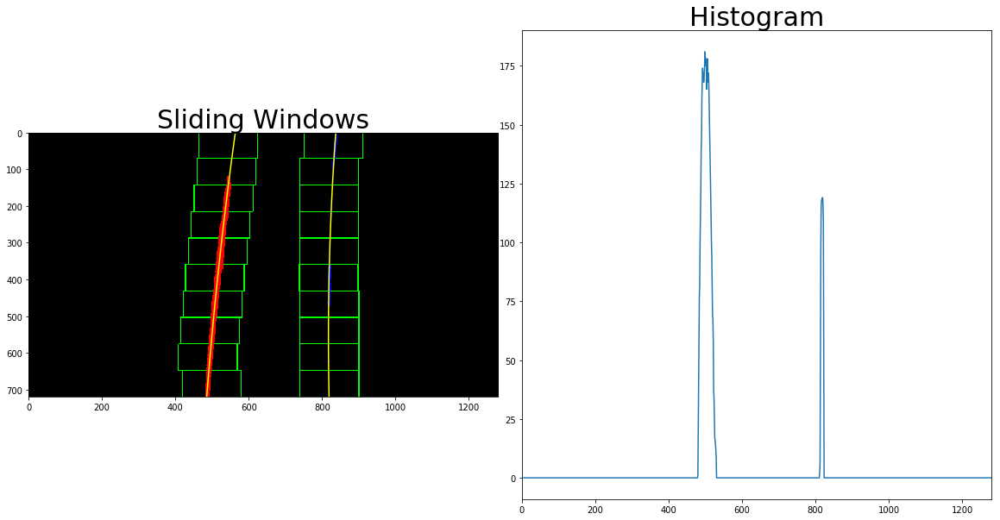

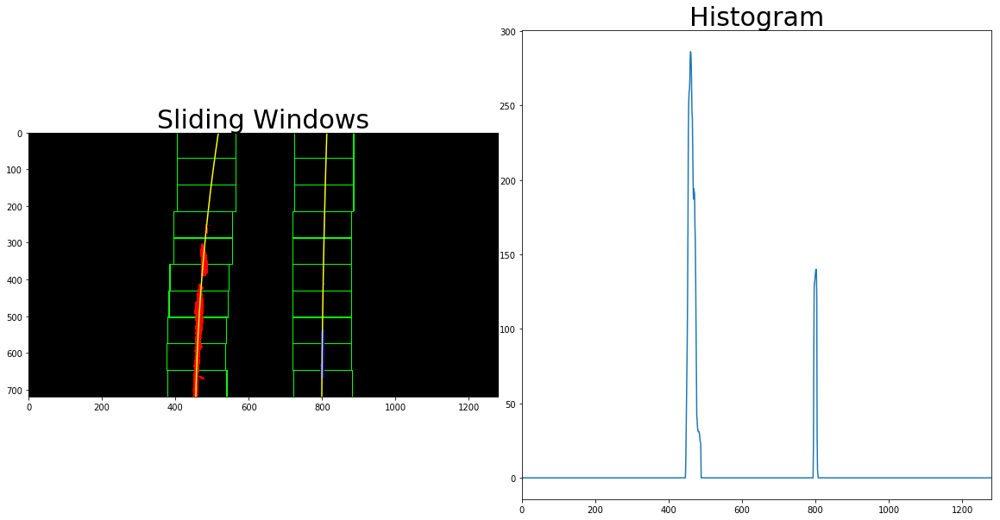

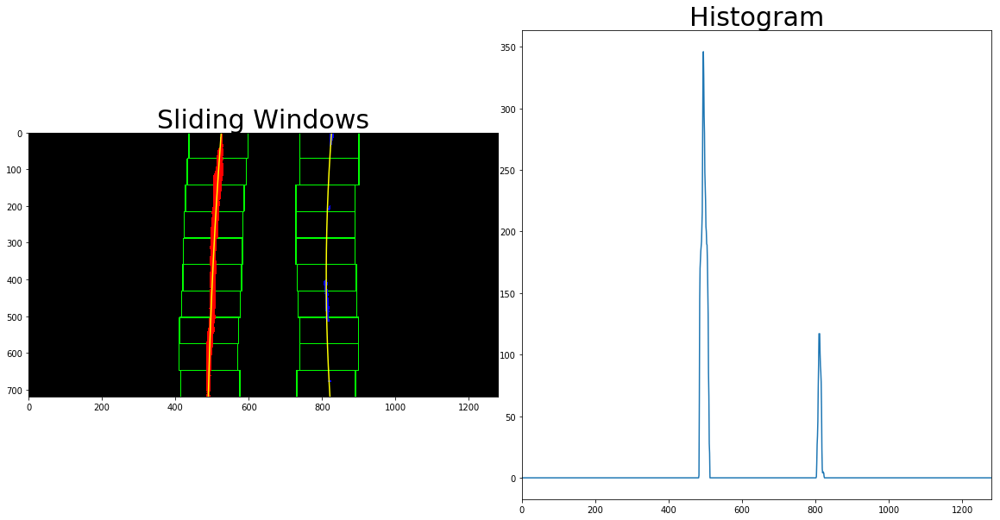

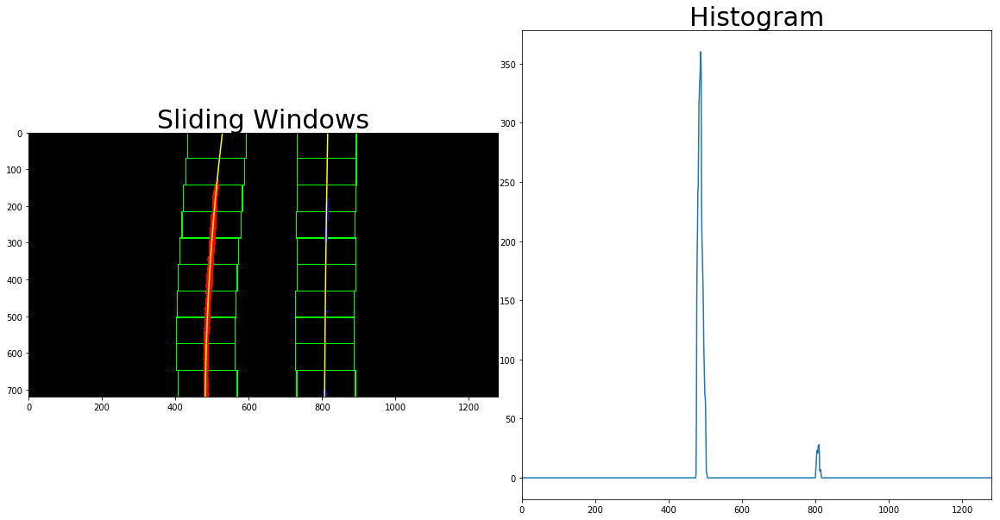

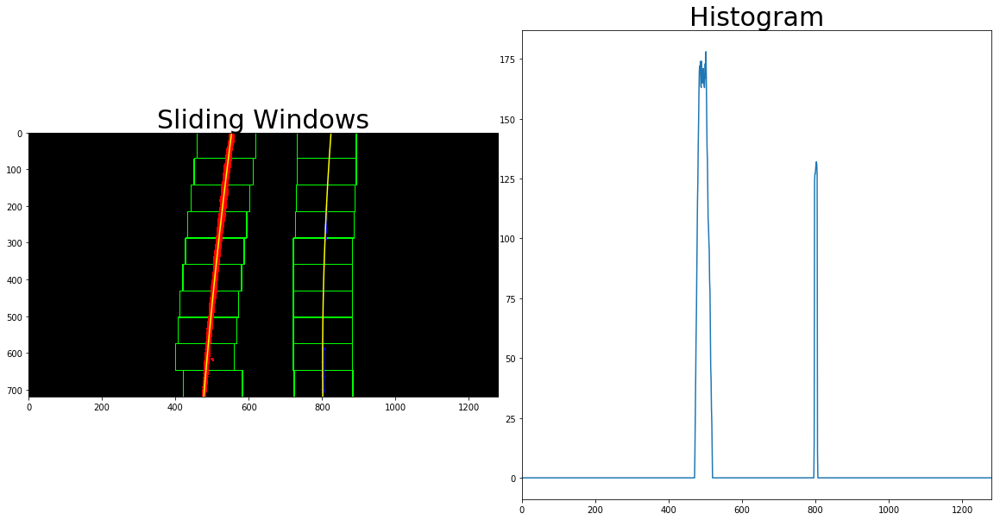

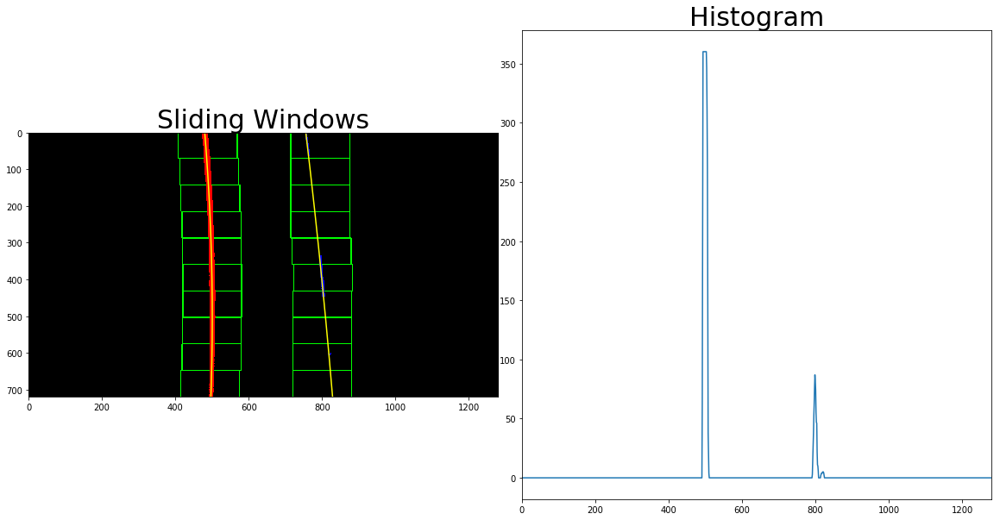

In [15]:
def sliding_window(binary_warped):
    # Assuming you have created a warped binary image called "binary_warped"
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Choose the number of sliding windows
    nwindows = 10
    # Set height of windows
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated for each window
    leftx_current = leftx_base
    rightx_current = rightx_base
    # Set the width of the windows +/- margin
    margin = 80
    # Set minimum number of pixels found to recenter window
    minpix = 40
    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []
    # Rectangle size
    rectangle_data = []
    
    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        rectangle_data.append((win_y_low, win_y_high, win_xleft_low, win_xleft_high, win_xright_low, win_xright_high))
        # Identify the nonzero pixels in x and y within the window
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]
        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        # If you found > minpix pixels, recenter next window on their mean position
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices
    left_lane_inds = np.concatenate(left_lane_inds)
    right_lane_inds = np.concatenate(right_lane_inds)
    
    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds] 
    
    left_fit, right_fit = (None, None)
    # Fit a second order polynomial to each
    if len(leftx) != 0:
        left_fit = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit = np.polyfit(righty, rightx, 2)
    return histogram, left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data
    
    
for f in (glob.glob("test_images/test*.jpg")):
    img = mpimg.imread(f)    
    img_select = Sobel_preprocess(img)
    binary_warped = SobelProcess(img_select)
    histogram, left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data = sliding_window(binary_warped)
    
    plt_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    for rect in rectangle_data:
    # Draw the windows on the visualization image
        cv2.rectangle(plt_img,(rect[2],rect[0]),(rect[3],rect[1]),(0,255,0), 2) 
        cv2.rectangle(plt_img,(rect[4],rect[0]),(rect[5],rect[1]),(0,255,0), 2) 
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    plt_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    plt_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20,10))
    f.subplots_adjust(hspace = .2, wspace=.05)
    ax1.imshow(plt_img)
    ax1.plot(left_fitx, ploty, color='yellow')
    ax1.plot(right_fitx, ploty, color='yellow')
    ax1.set_xlim(0, 1280)
    ax1.set_ylim(720, 0)
    ax1.set_title('Sliding Windows', fontsize=30)
    ax2.plot(histogram)
    ax2.set_xlim(0, 1280)
    ax2.set_title('Histogram', fontsize=30)

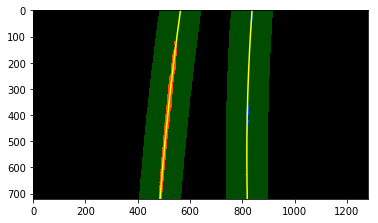

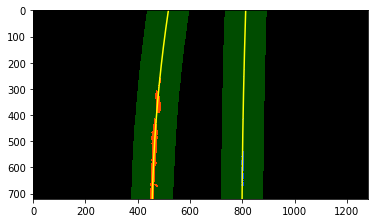

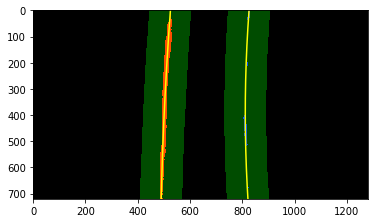

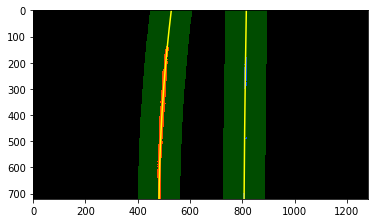

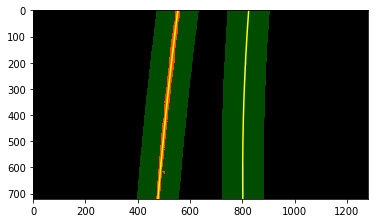

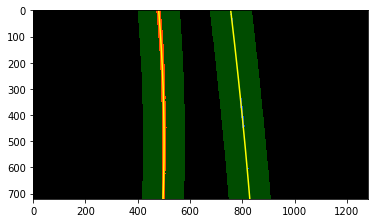

In [16]:
def polynomial_fit(binary_warped, left_fit, right_fit):
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    margin = 80
    left_lane_inds = ((nonzerox > (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] - margin)) & 
                      (nonzerox < (left_fit[0]*(nonzeroy**2) + left_fit[1]*nonzeroy + left_fit[2] + margin))) 
    right_lane_inds = ((nonzerox > (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] - margin)) & 
                       (nonzerox < (right_fit[0]*(nonzeroy**2) + right_fit[1]*nonzeroy + right_fit[2] + margin)))  

    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
    
    left_fit_new, right_fit_new = (None, None)
    if len(leftx) != 0:
        # Fit a second order polynomial to each
        left_fit_new = np.polyfit(lefty, leftx, 2)
    if len(rightx) != 0:
        right_fit_new = np.polyfit(righty, rightx, 2)
    return left_fit_new, right_fit_new, left_lane_inds, right_lane_inds


for f in (glob.glob("test_images/test*.jpg")):
    img = mpimg.imread(f)    
    img_select = Sobel_preprocess(img)
    binary_warped = SobelProcess(img_select)
    histogram, left_fit, right_fit, left_lane_inds, right_lane_inds, rectangle_data = sliding_window(binary_warped)
    left_fit_new, right_fit_new, left_lane_inds, right_lane_inds = polynomial_fit(binary_warped, left_fit, right_fit)
    
    plt_img = np.uint8(np.dstack((binary_warped, binary_warped, binary_warped))*255)
    window_img = np.zeros_like(plt_img)
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    left_fitx_new = left_fit_new[0]*ploty**2 + left_fit_new[1]*ploty + left_fit_new[2]
    right_fitx_new = right_fit_new[0]*ploty**2 + right_fit_new[1]*ploty + right_fit_new[2]
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    plt_img[nonzeroy[left_lane_inds], nonzerox[left_lane_inds]] = [255, 0, 0]
    plt_img[nonzeroy[right_lane_inds], nonzerox[right_lane_inds]] = [0, 0, 255]
    # Generate a polygon to illustrate the search window area (OLD FIT)
    # And recast the x and y points into usable format for cv2.fillPoly()
    left_line_window1 = np.array([np.transpose(np.vstack([left_fitx-80, ploty]))])
    left_line_window2 = np.array([np.flipud(np.transpose(np.vstack([left_fitx+80, ploty])))])
    left_line_pts = np.hstack((left_line_window1, left_line_window2))
    right_line_window1 = np.array([np.transpose(np.vstack([right_fitx-80, ploty]))])
    right_line_window2 = np.array([np.flipud(np.transpose(np.vstack([right_fitx+80, ploty])))])
    right_line_pts = np.hstack((right_line_window1, right_line_window2))
    # Draw the lane onto the warped blank image
    cv2.fillPoly(window_img, np.int_([left_line_pts]), (0,255, 0))
    cv2.fillPoly(window_img, np.int_([right_line_pts]), (0,255, 0))
    result = cv2.addWeighted(plt_img, 1, window_img, 0.3, 0)
    plt.figure()
    plt.imshow(result)
    plt.plot(left_fitx_new, ploty, color='yellow')
    plt.plot(right_fitx_new, ploty, color='yellow')
    plt.xlim(0, 1280)
    plt.ylim(720, 0)

In [17]:
# Method to determine radius of curvature and distance from lane center 
# based on binary image, polynomial fit, and L and R lane pixel indices
def calc_curv_rad_and_center_dist(bin_img, l_fit, r_fit, l_lane_inds, r_lane_inds):
    # Define conversions in x and y from pixels space to meters
    ym_per_pix = 3.048/100 # meters per pixel in y dimension, lane line is 10 ft = 3.048 meters
    xm_per_pix = 3.7/378 # meters per pixel in x dimension, lane width is 12 ft = 3.7 meters
    left_curverad, right_curverad, center_dist = (0, 0, 0)
    # Define y-value where we want radius of curvature
    # I'll choose the maximum y-value, corresponding to the bottom of the image
    h = bin_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    y_eval = np.max(ploty)
  
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = bin_img.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Again, extract left and right line pixel positions
    leftx = nonzerox[l_lane_inds]
    lefty = nonzeroy[l_lane_inds] 
    rightx = nonzerox[r_lane_inds]
    righty = nonzeroy[r_lane_inds]
    
    if len(leftx) != 0 and len(rightx) != 0:
        # Fit new polynomials to x,y in world space
        left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
        right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        # Calculate the new radii of curvature
        left_curverad = ((1 + (2*left_fit_cr[0]*y_eval*ym_per_pix + left_fit_cr[1])**2)**1.5) / np.absolute(2*left_fit_cr[0])
        right_curverad = ((1 + (2*right_fit_cr[0]*y_eval*ym_per_pix + right_fit_cr[1])**2)**1.5) / np.absolute(2*right_fit_cr[0])
        # Now our radius of curvature is in meters
    
    # Distance from center is image x midpoint - mean of l_fit and r_fit intercepts 
    if r_fit is not None and l_fit is not None:
        car_position = bin_img.shape[1]/2
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        lane_center_position = (r_fit_x_int + l_fit_x_int) /2
        center_dist = (car_position - lane_center_position) * xm_per_pix
    return left_curverad, right_curverad, center_dist


rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(binary_warped, left_fit, right_fit, left_lane_inds, right_lane_inds)
print('Radius of curvature for example:', rad_l, 'm,', rad_r, 'm')
print('Distance from lane center for example:', d_center, 'm')

Radius of curvature for example: 585.6218266179394 m, 1922.9803543221594 m
Distance from lane center for example: -0.22230240789210648 m


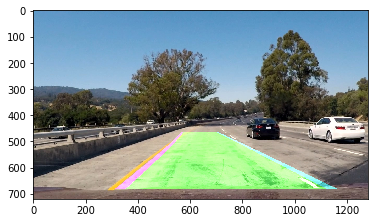

In [18]:
def draw_lane(original_img, binary_img, l_fit, r_fit, Minv):
    new_img = np.copy(original_img)
    if l_fit is None or r_fit is None:
        return original_img
    # Create an image to draw the lines on
    warp_zero = np.zeros_like(binary_img).astype(np.uint8)
    color_warp = np.dstack((warp_zero, warp_zero, warp_zero))
    
    h,w = binary_img.shape
    ploty = np.linspace(0, h-1, num=h)# to cover same y-range as image
    left_fitx = l_fit[0]*ploty**2 + l_fit[1]*ploty + l_fit[2]
    right_fitx = r_fit[0]*ploty**2 + r_fit[1]*ploty + r_fit[2]

    # Recast the x and y points into usable format for cv2.fillPoly()
    pts_left = np.array([np.transpose(np.vstack([left_fitx, ploty]))])
    pts_right = np.array([np.flipud(np.transpose(np.vstack([right_fitx, ploty])))])
    pts = np.hstack((pts_left, pts_right))

    # Draw the lane onto the warped blank image
    cv2.fillPoly(color_warp, np.int_([pts]), (0,255, 0))
    cv2.polylines(color_warp, np.int32([pts_left]), isClosed=False, color=(255,0,255), thickness=15)
    cv2.polylines(color_warp, np.int32([pts_right]), isClosed=False, color=(0,255,255), thickness=15)

    # Warp the blank back to original image space using inverse perspective matrix (Minv)
    newwarp = cv2.warpPerspective(color_warp, Minv, (w, h)) 
    # Combine the result with the original image
    result = cv2.addWeighted(new_img, 1, newwarp, 0.5, 0)
    return result


img = mpimg.imread("test_images/test1.jpg")    
img_select = Sobel_preprocess(img)
binary_warped = SobelProcess(img_select)
line_img = draw_lane(img, binary_warped, left_fit, right_fit, Minv)
plt.figure()
plt.imshow(line_img)

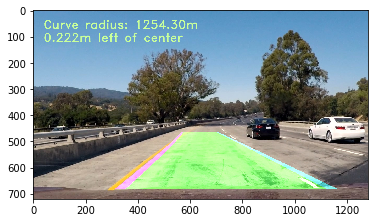

In [19]:
def draw_data(original_img, curv_rad, center_dist):
    new_img = np.copy(original_img)
    h = new_img.shape[0]
    font = cv2.FONT_HERSHEY_DUPLEX
    text = 'Curve radius: ' + '{:04.2f}'.format(curv_rad) + 'm'
    cv2.putText(new_img, text, (40,70), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    direction = ''
    if center_dist > 0:
        direction = 'right'
    elif center_dist < 0:
        direction = 'left'
    abs_center_dist = abs(center_dist)
    text = '{:04.3f}'.format(abs_center_dist) + 'm ' + direction + ' of center'
    cv2.putText(new_img, text, (40,120), font, 1.5, (200,255,155), 2, cv2.LINE_AA)
    return new_img

line_data_img = draw_data(line_img, (rad_l+rad_r)/2, d_center)
plt.figure()
plt.imshow(line_data_img)

In [20]:
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # was the line detected in the last iteration?
        self.detected = False  
        # x values of the last n fits of the line
        self.recent_xfitted = [] 
        #average x values of the fitted line over the last n iterations
        self.bestx = None     
        #polynomial coefficients averaged over the last n iterations
        self.best_fit = None  
        #polynomial coefficients for the most recent fit
        self.current_fit = []  
        #radius of curvature of the line in some units
        self.radius_of_curvature = None 
        #distance in meters of vehicle center from the line
        self.line_base_pos = None 
        #difference in fit coefficients between last and new fits
        self.diffs = np.array([0,0,0], dtype='float') 
        #number of detected pixels
        self.px_count = None
    def add_fit(self, fit, inds):
        # add a found fit to the line, up to n
        if fit is not None:
            if self.best_fit is not None:
                # if we have a best fit, see how this new fit compares
                self.diffs = abs(fit-self.best_fit)
            if (self.diffs[0] > 0.001 or \
               self.diffs[1] > 1.0 or \
               self.diffs[2] > 100.) and \
               len(self.current_fit) > 0:
                # bad fit! abort! abort! ... well, unless there are no fits in the current_fit queue, then we'll take it
                self.detected = False
            else:
                self.detected = True
                self.px_count = np.count_nonzero(inds)
                self.current_fit.append(fit)
                if len(self.current_fit) > 5:
                    # throw out old fits, keep newest n
                    self.current_fit = self.current_fit[len(self.current_fit)-5:]
                self.best_fit = np.average(self.current_fit, axis=0)
        # or remove one from the history, if not found
        else:
            self.detected = False
            if len(self.current_fit) > 0:
                # throw out oldest fit
                self.current_fit = self.current_fit[:len(self.current_fit)-1]
            if len(self.current_fit) > 0:
                # if there are still any fits in the queue, best_fit is their average
                self.best_fit = np.average(self.current_fit, axis=0)

print("Done.")

Done.


In [21]:
def process_image(img):
    new_img = np.copy(img)
    img_select = Sobel_preprocess(new_img)
    binary_warped = SobelProcess(img_select)
    
    # if both left and right lines were detected last frame, use polynomial_fit, otherwise use sliding_window
    if not l_line.detected or not r_line.detected:
        _, l_fit, r_fit, l_lane_inds, r_lane_inds, _ = sliding_window(binary_warped)
    else:
        l_fit, r_fit, l_lane_inds, r_lane_inds = polynomial_fit(binary_warped, l_line.best_fit, r_line.best_fit)
        
    # invalidate both fits if the difference in their x-intercepts isn't around 350 px (+/- 100 px)
    if l_fit is not None and r_fit is not None:
        # calculate x-intercept (bottom of image, x=image_height) for fits
        h = img.shape[0]
        l_fit_x_int = l_fit[0]*h**2 + l_fit[1]*h + l_fit[2]
        r_fit_x_int = r_fit[0]*h**2 + r_fit[1]*h + r_fit[2]
        x_int_diff = abs(r_fit_x_int-l_fit_x_int)
        if abs(350 - x_int_diff) > 100:
            l_fit = None
            r_fit = None
            
    l_line.add_fit(l_fit, l_lane_inds)
    r_line.add_fit(r_fit, r_lane_inds)
    
    # draw the current best fit if it exists
    if l_line.best_fit is not None and r_line.best_fit is not None:
        img_out1 = draw_lane(new_img, binary_warped, l_line.best_fit, r_line.best_fit, Minv)
        rad_l, rad_r, d_center = calc_curv_rad_and_center_dist(binary_warped, l_line.best_fit, r_line.best_fit, 
                                                               l_lane_inds, r_lane_inds)
        img_out = draw_data(img_out1, (rad_l+rad_r)/2, d_center)
    else:
        img_out = new_img
    
    diagnostic_output = False
    if diagnostic_output:
        # put together multi-view output
        diag_img = np.zeros((720,1280,3), dtype=np.uint8)
        
        # original output (top left)
        diag_img[0:360,0:640,:] = cv2.resize(img_out,(640,360))
        
        # binary overhead view (top right)
        binary_warped = np.dstack((binary_warped*255, binary_warped*255, binary_warped*255))
        resized_img_bin = cv2.resize(binary_warped,(640,360))
        diag_img[0:360,640:1280, :] = resized_img_bin
        
        # overhead with all fits added (bottom right)
        img_bin_fit = np.copy(binary_warped)
        for i, fit in enumerate(l_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (20*i+100,0,20*i+100))
        for i, fit in enumerate(r_line.current_fit):
            img_bin_fit = plot_fit_onto_img(img_bin_fit, fit, (0,20*i+100,20*i+100))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, l_line.best_fit, (255,255,0))
        img_bin_fit = plot_fit_onto_img(img_bin_fit, r_line.best_fit, (255,255,0))
        diag_img[360:720,640:1280,:] = cv2.resize(img_bin_fit,(640,360))
        
        # diagnostic data (bottom left)
        color_ok = (200,255,155)
        color_bad = (255,155,155)
        font = cv2.FONT_HERSHEY_DUPLEX
        if l_fit is not None:
            text = 'This fit L: ' + ' {:0.6f}'.format(l_fit[0]) + \
                                    ' {:0.6f}'.format(l_fit[1]) + \
                                    ' {:0.6f}'.format(l_fit[2])
        else:
            text = 'This fit L: None'
        cv2.putText(diag_img, text, (40,380), font, .5, color_ok, 1, cv2.LINE_AA)
        if r_fit is not None:
            text = 'This fit R: ' + ' {:0.6f}'.format(r_fit[0]) + \
                                    ' {:0.6f}'.format(r_fit[1]) + \
                                    ' {:0.6f}'.format(r_fit[2])
        else:
            text = 'This fit R: None'
        cv2.putText(diag_img, text, (40,400), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit L: ' + ' {:0.6f}'.format(l_line.best_fit[0]) + \
                                ' {:0.6f}'.format(l_line.best_fit[1]) + \
                                ' {:0.6f}'.format(l_line.best_fit[2])
        cv2.putText(diag_img, text, (40,440), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Best fit R: ' + ' {:0.6f}'.format(r_line.best_fit[0]) + \
                                ' {:0.6f}'.format(r_line.best_fit[1]) + \
                                ' {:0.6f}'.format(r_line.best_fit[2])
        cv2.putText(diag_img, text, (40,460), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Diffs L: ' + ' {:0.6f}'.format(l_line.diffs[0]) + \
                             ' {:0.6f}'.format(l_line.diffs[1]) + \
                             ' {:0.6f}'.format(l_line.diffs[2])
        if l_line.diffs[0] > 0.001 or \
           l_line.diffs[1] > 1.0 or \
           l_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,500), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Diffs R: ' + ' {:0.6f}'.format(r_line.diffs[0]) + \
                             ' {:0.6f}'.format(r_line.diffs[1]) + \
                             ' {:0.6f}'.format(r_line.diffs[2])
        if r_line.diffs[0] > 0.001 or \
           r_line.diffs[1] > 1.0 or \
           r_line.diffs[2] > 100.:
            diffs_color = color_bad
        else:
            diffs_color = color_ok
        cv2.putText(diag_img, text, (40,520), font, .5, diffs_color, 1, cv2.LINE_AA)
        text = 'Good fit count L:' + str(len(l_line.current_fit))
        cv2.putText(diag_img, text, (40,560), font, .5, color_ok, 1, cv2.LINE_AA)
        text = 'Good fit count R:' + str(len(r_line.current_fit))
        cv2.putText(diag_img, text, (40,580), font, .5, color_ok, 1, cv2.LINE_AA)
        
        img_out = diag_img
    return img_out

print('Done.')

Done.


In [22]:
def plot_fit_onto_img(img, fit, plot_color):
    if fit is None:
        return img
    new_img = np.copy(img)
    h = new_img.shape[0]
    ploty = np.linspace(0, h-1, h)
    plotx = fit[0]*ploty**2 + fit[1]*ploty + fit[2]
    pts = np.array([np.transpose(np.vstack([plotx, ploty]))])
    cv2.polylines(new_img, np.int32([pts]), isClosed=False, color=plot_color, thickness=8)
    return new_img

print('Done.')

Done.


In [23]:
from moviepy.editor import VideoFileClip

l_line = Line()
r_line = Line()
#my_clip.write_gif('test.gif', fps=12)
video_output1 = 'project_video_output.mp4'
video_input1 = VideoFileClip('project_video.mp4')
processed_video = video_input1.fl_image(process_image)
%time processed_video.write_videofile(video_output1, audio=False)

[MoviePy] >>>> Building video project_video_output.mp4
[MoviePy] Writing video project_video_output.mp4


100%|█████████▉| 1260/1261 [02:33<00:00,  8.21it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: project_video_output.mp4 

CPU times: user 2min 44s, sys: 19.3 s, total: 3min 3s
Wall time: 2min 35s


In [24]:
from IPython.display import HTML

HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_output1))

In [25]:
challenge_output = 'challenge_video_out.mp4'

clip2 = VideoFileClip('challenge_video.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(challenge_output, audio=False)

[MoviePy] >>>> Building video challenge_video_out.mp4
[MoviePy] Writing video challenge_video_out.mp4


100%|██████████| 485/485 [00:55<00:00,  8.72it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: challenge_video_out.mp4 

CPU times: user 1min 1s, sys: 8.31 s, total: 1min 9s
Wall time: 56.9 s


In [26]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_output))

In [27]:
challenge_hard_output = 'harder_challenge_video_out.mp4'

clip2 = VideoFileClip('harder_challenge_video.mp4')
yellow_clip = clip2.fl_image(process_image)
%time yellow_clip.write_videofile(challenge_hard_output, audio=False)

[MoviePy] >>>> Building video harder_challenge_video_out.mp4
[MoviePy] Writing video harder_challenge_video_out.mp4


100%|█████████▉| 1199/1200 [03:01<00:00,  6.60it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: harder_challenge_video_out.mp4 

CPU times: user 3min, sys: 33.4 s, total: 3min 34s
Wall time: 3min 3s


In [28]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(challenge_hard_output))